# Qwen3.8-27B for Computer Vision: A Hands-On Tour on Google Colab

This notebook is a broad, prune-to-taste tour of using **Qwen3.8-27B**, an open Apache-2.0 vision-language model, for real computer vision problems. It runs on Google Colab (Pro / Pro+ with an **A100** recommended).

**How this notebook is organized**
1. Runtime check and install
2. Load the model (the ONE cell to edit if the model API differs)
3. Helper functions and the media asset list
4. "Getting started" basics
5. Vision application demos, grouped by capability, across many domains and styles
6. Practical notes: memory, prompting, and honest limitations

Every demo calls a single `ask()` helper, so you can add or remove demos freely without breaking the rest.


## 1. Runtime check and install

Confirm you have a GPU (ideally an A100), then install the libraries. Versions move fast for a brand-new model, so we pull the latest.

In [2]:
!nvidia-smi

Mon Sep  7 18:37:12 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   30C    P0             44W /  400W |       0MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [3]:
# One clean install. Run the whole notebook top to bottom; no runtime restart needed.
#
# Why the Pillow pin: the libraries below would otherwise upgrade Pillow to 12.0.0, which is
# currently incompatible on Colab and breaks image imports with
#   ImportError: cannot import name '_Ink' from 'PIL._typing'
# Colab's own Pillow works, so we keep it by pinning its version; the upgrade then never
# pulls 12.0.0. (If Colab itself ships 12.x, we fall back to the last known-good 11.x.)
import PIL
pil_pin = f"pillow=={PIL.__version__}" if int(PIL.__version__.split(".")[0]) < 12 else "pillow<12"

!pip install -q -U transformers accelerate bitsandbytes qwen-vl-utils matplotlib av "imageio[ffmpeg]" {pil_pin}

# If the MODEL cell later fails on this brand-new architecture, also install transformers
# from source and re-run Section 2:  !pip install -q -U "git+https://github.com/huggingface/transformers.git" {pil_pin}
print("Install complete:", pil_pin, "| run the notebook top to bottom, no restart.")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.3/80.3 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.1/43.1 MB 53.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.0/10.0 MB 100.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.8/35.8 MB 43.4 MB/s eta 0:00:00
Install complete: pillow==11.3.0 | run the notebook top to bottom, no restart.


## 2. Load the model (the single point of change)

This is the only cell whose exact API depends on the model card. Qwen3.8-27B is a dense 27B vision-language model, so it does not fit on a 40 GB A100 in bf16 (~54 GB of weights). We load it **quantized**:

- `load_in_8bit=True` -> ~27 GB weights, best quality that fits a 40 GB A100
- `load_in_4bit=True`  -> ~14-16 GB weights, most headroom for long video

If the class names or arguments have shifted since release, this is the one place to fix. Common alternatives are noted in the comments. Because every demo below calls the shared `ask()` helper, fixing this cell fixes the whole notebook.

In [4]:
import torch
from transformers import AutoProcessor, BitsAndBytesConfig

# The auto class for an image-text-to-text model. If this import/loader fails on the
# new architecture, try these in order:
#   from transformers import AutoModelForImageTextToText as VLModel   (default below)
#   from transformers import AutoModelForMultimodalLM as VLModel
#   from transformers import AutoModelForVision2Seq   as VLModel
#   ...or add trust_remote_code=True to from_pretrained, and/or install transformers from source.
from transformers import AutoModelForImageTextToText as VLModel

MODEL_ID = "Qwen/Qwen3.8-27B"          # or "Qwen/Qwen3.8-27B-FP8" for a pre-quantized fit

USE_4BIT = True                        # set False to use 8-bit on a 40 GB A100
bnb = BitsAndBytesConfig(
    load_in_4bit=USE_4BIT,
    load_in_8bit=not USE_4BIT,
    bnb_4bit_quant_type="nf4",
    bnb_4bit_compute_dtype=torch.bfloat16,
    bnb_4bit_use_double_quant=True,
)

processor = AutoProcessor.from_pretrained(MODEL_ID, trust_remote_code=True)
model = VLModel.from_pretrained(
    MODEL_ID,
    quantization_config=bnb,
    device_map="auto",
    torch_dtype=torch.bfloat16,
    trust_remote_code=True,
)
model.eval()
print("Loaded", MODEL_ID)

preprocessor_config.json:   0%|          | 0.00/390 [00:00<?, ?B/s]

chat_template.jinja:   0%|          | 0.00/8.95k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.31k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/6.72M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/3.35M [00:00<?, ?B/s]

tokenizer.json: reconstructing file:   0%|          |  0.00B / 12.8MB            

tokenizer.json: downloading bytes:           |  0.00B            

video_preprocessor_config.json:   0%|          | 0.00/385 [00:00<?, ?B/s]

[transformers] `torch_dtype` is deprecated! Use `dtype` instead!


model.safetensors.index.json:   0%|          | 0.00/112k [00:00<?, ?B/s]

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/1184 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/202 [00:00<?, ?B/s]

Loaded Qwen/Qwen3.8-27B


In [5]:
# Quick memory footprint
free, total = torch.cuda.mem_get_info()
print(f"GPU memory used by model + overhead: {(total-free)/1e9:.1f} GB / {total/1e9:.1f} GB total")

GPU memory used by model + overhead: 18.6 GB / 42.4 GB total


## 3. Helper functions and media assets

`ask()` is the universal entry point: give it a prompt plus any images and/or a video, optionally turn on `think` (the model's reasoning mode), and get text back. The rest are small conveniences: downloading the sample media into the `assets` folder, showing images and video frames, and drawing the bounding boxes the model returns as text.

In [6]:
import os, json
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

try:
    from qwen_vl_utils import process_vision_info
    HAVE_QWEN_UTILS = True
except Exception:
    HAVE_QWEN_UTILS = False
    print("qwen_vl_utils not available; will pass media directly to the processor.")

def ask(prompt, images=None, video=None, think=False, max_new_tokens=512):
    """One entry point for every demo.
    images: a path/URL or a list of them.  video: a path/URL to a video file.
    think:  turn on the model's reasoning mode for harder, multi-step tasks."""
    content = []
    if video is not None:
        content.append({"type": "video", "video": video, "fps": 2.0})
    if images is not None:
        imgs = images if isinstance(images, (list, tuple)) else [images]
        for im in imgs:
            content.append({"type": "image", "image": im})
    content.append({"type": "text", "text": prompt})
    messages = [{"role": "user", "content": content}]

    # enable_thinking follows the Qwen chat-template convention; if the template rejects
    # it on this build, drop the kwarg here (this is the only place it is used).
    text = processor.apply_chat_template(
        messages, tokenize=False, add_generation_prompt=True, enable_thinking=think,
    )
    if HAVE_QWEN_UTILS:
        image_inputs, video_inputs = process_vision_info(messages)
    else:
        image_inputs, video_inputs = None, None
    inputs = processor(
        text=[text], images=image_inputs, videos=video_inputs,
        padding=True, return_tensors="pt",
    ).to(model.device)

    with torch.no_grad():
        out = model.generate(**inputs, max_new_tokens=max_new_tokens, do_sample=False)
    trimmed = out[:, inputs.input_ids.shape[1]:]
    return processor.batch_decode(trimmed, skip_special_tokens=True)[0].strip()


### Sample media

The sample images and clips are hosted in this notebook's GitHub folder, so it is fully self-contained: the cell below downloads them once into the `assets` folder, and every demo then loads one with `fetch(key)`. To use your own media, add a file to `assets` and point its key at it in the `FILES` map.

In [7]:
import urllib.request

ASSET_DIR   = "assets"
GITHUB_BASE = "https://raw.githubusercontent.com/spmallick/learnopencv/master/Qwen3-vl-27b-computer-vision-demos/assets"

# Demo key -> file name (in the assets folder and in the GitHub repo above)
FILES = {
    "ppe":          "construction_ppe.jpg",
    "retail":       "retail_shelf.jpg",
    "traffic":      "city_traffic.jpg",
    "indoor":       "living_room.jpg",
    "fruit":        "fruit_bowl.jpg",
    "defect":       "metal_surface_defect.jpg",
    "plant":        "diseased_crop_leaf.jpg",
    "car_damage":   "damaged_vehicle.jpg",
    "before":       "glacier_2009.jpg",
    "after":        "glacier_2019.jpg",
    "street_scene": "pedestrian_crossing.jpg",
    "chart":        "bar_chart.png",
    "diagram":      "frog_lifecycle_diagram.jpg",
    "sign":         "multilingual_sign.jpg",
    "painting":     "great_wave_painting.jpg",
    "soccer_img":   "soccer_match.jpg",
    "vid_activity": "pedestrian_walk.webm",
    "vid_traffic":  "dashcam_drive.webm",
    "vid_soccer":   "football_match.webm",
}

os.makedirs(ASSET_DIR, exist_ok=True)
for _name in FILES.values():
    _dst = os.path.join(ASSET_DIR, _name)
    if not os.path.exists(_dst):
        urllib.request.urlretrieve(f"{GITHUB_BASE}/{_name}", _dst)
print(len(os.listdir(ASSET_DIR)), "files ready in", ASSET_DIR)

def fetch(key):
    """Return the local path of the sample file for `key` (downloaded from the repo above)."""
    if key not in FILES:
        raise KeyError(f"Unknown asset key '{key}'. Known keys: {sorted(FILES)}")
    return os.path.join(ASSET_DIR, FILES[key])

def show_image(path_or_img, title="", size=6):
    img = Image.open(path_or_img).convert("RGB") if isinstance(path_or_img, str) else path_or_img
    plt.figure(figsize=(size, size)); plt.imshow(img); plt.axis("off")
    if title: plt.title(title)
    plt.show()

def show_frames(path, n=6, size=3):
    """Display n evenly spaced frames from a video (robust across webm/ogv/mp4 via OpenCV+ffmpeg)."""
    import cv2
    cap = cv2.VideoCapture(path)
    total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT) or 0)
    frames = []
    if total > 1:
        for j in [int(total * k / n) for k in range(n)]:
            cap.set(cv2.CAP_PROP_POS_FRAMES, j)
            ok, fr = cap.read()
            if ok: frames.append(fr)
    else:                                      # some containers report no count; read sequentially
        while len(frames) < n:
            ok, fr = cap.read()
            if not ok: break
            frames.append(fr)
    cap.release()
    if not frames:
        print("Could not read frames; the file downloaded but this backend can't decode it.")
        return
    cols = min(3, len(frames)); rows = (len(frames) + cols - 1) // cols
    plt.figure(figsize=(cols * size, rows * size))
    for i, fr in enumerate(frames):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(cv2.cvtColor(fr, cv2.COLOR_BGR2RGB)); plt.axis("off"); plt.title(f"frame {i}")
    plt.tight_layout(); plt.show()

def extract_json(text):
    """Pull the first JSON array/object out of a model reply (tolerates code fences and prose)."""
    text = text.replace("```json", "").replace("```", "")
    for opener, closer in (("[", "]"), ("{", "}")):
        i, j = text.find(opener), text.rfind(closer)
        if i != -1 and j != -1 and j > i:
            try:
                return json.loads(text[i:j+1])
            except Exception:
                pass
    return None

def draw_boxes(image_path, reply, coord_scale="auto"):
    """Draw boxes the model returned as JSON (keys: bounding_box / bbox / box = [x1,y1,x2,y2]).
    Qwen3-VL returns coordinates normalized to 0-1000, so by default we auto-detect that
    (largest coordinate <= 1000) and rescale to the image. Pass coord_scale=1000 to force
    normalized, or coord_scale=None to treat the numbers as raw pixels."""
    img = Image.open(image_path).convert("RGB"); W, H = img.size
    data = extract_json(reply)
    items = data if isinstance(data, list) else (data.get("objects", []) if isinstance(data, dict) else [])
    boxes = []
    for k, obj in enumerate(items or []):
        if not isinstance(obj, dict): continue
        box = obj.get("bounding_box") or obj.get("bbox_2d") or obj.get("bbox") or obj.get("box")
        if not box or len(box) != 4: continue
        label = obj.get("label") or obj.get("person_id") or obj.get("id") or str(k)
        boxes.append((list(box), str(label)))
    if coord_scale == "auto":
        mx = max((max(b) for b, _ in boxes), default=0)
        coord_scale = 1000 if mx <= 1000 else None       # Qwen-VL uses 0-1000 normalized coords
    fig, ax = plt.subplots(figsize=(8, 8)); ax.imshow(img); ax.axis("off")
    for (x1, y1, x2, y2), label in boxes:
        if coord_scale:
            x1, x2 = x1 / coord_scale * W, x2 / coord_scale * W
            y1, y2 = y1 / coord_scale * H, y2 / coord_scale * H
        ax.add_patch(patches.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, linewidth=2, edgecolor="red"))
        ax.text(x1, max(0, y1 - 6), label, color="white", fontsize=10,
                bbox=dict(facecolor="red", pad=1, edgecolor="none"))
    plt.show()
    return items

from IPython.display import HTML
from base64 import b64encode
def show_video(path, width=480):
    """Optional inline player. Frame montage (show_frames) is more reliable for webm/ogv."""
    mime = {"webm": "video/webm", "ogv": "video/ogg", "ogg": "video/ogg"}.get(path.rsplit(".", 1)[-1], "video/mp4")
    data = b64encode(open(path, "rb").read()).decode()
    return HTML(f'<video width="{width}" controls><source src="data:{mime};base64,{data}" type="{mime}"></video>')

print("Helpers ready.")


19 files ready in assets
Helpers ready.


## 4. Getting started: the simplest possible use

Before the applications, the basic loop: one image, one question. This is the "how to use it on Colab" part. Notice how little ceremony there is once `ask()` exists.

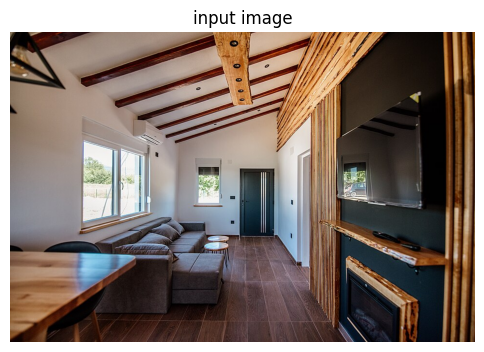

This cozy, modern cabin interior features warm wooden beams, a vaulted ceiling, and rustic wood paneling that blend with contemporary furnishings like a gray sectional sofa and dark hardwood floors. The mood is inviting and serene, enhanced by natural light streaming through the windows and the subtle glow of recessed lighting, creating a harmonious balance between rustic charm and minimalist design.


In [8]:
img = fetch("indoor")            # any image works; swap the key or paste your own URL
show_image(img, "input image")
print(ask("Describe this image in two sentences. What is the setting and the mood?", images=img))

The same image, different questions. One model, many tasks, just by changing the words.

In [9]:
print("== Objective caption ==")
print(ask("In 3-4 sentences, caption this image: the setting and the main objects and their arrangement.", images=img))
print("\n== Visual question answering ==")
print(ask("In one sentence, roughly how many distinct objects are in the scene, and which is the largest?", images=img))
print("\n== Creative style ==")
print(ask("Write a one-line real-estate listing headline for this room.", images=img))

== Objective caption ==
This cozy, modern living space features a vaulted ceiling with exposed wooden beams and a warm, rustic aesthetic. A large gray sectional sofa sits along the left wall beneath a bright window, facing a wall-mounted TV above a wood-framed fireplace on the right. The room is anchored by dark hardwood floors and accented with natural wood paneling, creating a harmonious blend of contemporary comfort and cabin-style charm.

== Visual question answering ==
There are roughly 15 distinct objects in the scene, and the largest is the sectional sofa.

== Creative style ==
Rustic Modern Retreat: Vaulted Timber Ceilings & Cozy Corner Fireplace in a Light-Filled Open-Plan Living Space


### Thinking mode: off vs on

The model can answer directly, or take a few reasoning steps first. Thinking mode helps on tasks that need deliberation (counting, inspection, comparison) and only adds latency on easy ones. Compare the two on the same question.

In [10]:
q = "Look carefully. Are there any safety or trip hazards in this scene? Reason step by step, then give a final verdict."
print("---- think=False ----")
print(ask(q, images=img, think=False))
print("\n---- think=True ----")
print(ask(q, images=img, think=True, max_new_tokens=700))

---- think=False ----
Based on a careful examination of the image, here is a step-by-step analysis of potential safety or trip hazards:

1.  **Flooring:** The floor is made of large, flat tiles or planks. There are no visible rugs, loose cables, or uneven surfaces that would create a tripping hazard. The transition from the main floor area to the entryway appears to be level.
2.  **Furniture Placement:** The furniture (sofa, coffee tables, dining table) is arranged with clear pathways. There is ample space to walk around the seating area and towards the door without obstruction.
3.  **Ceiling and Overhead Elements:** The exposed wooden beams are part of the architectural design and are securely fastened. They are high enough not to pose a head-strike risk for an average-height person.
4.  **Wall-mounted Items:** The television and the fireplace are securely mounted. The wooden shelf below the TV is also fixed to the wall. None of these items appear to be loose or precariously placed.
5

## 5. Vision application demos

The main event. Each block states the real-world problem, then runs the model. Grouped by capability, across domains and styles. Prune freely.

### A. Open-vocabulary detection and visual grounding

Turn a phrase into locations in the image, with no task-specific detector and no labeled data. The model returns coordinates as text; `draw_boxes()` renders them. Boxes are approximate, so treat this as a flexible first pass, not metrology.

**A1. Workplace safety / PPE compliance.** Ask a safety question in plain English and get per-person answers with boxes.

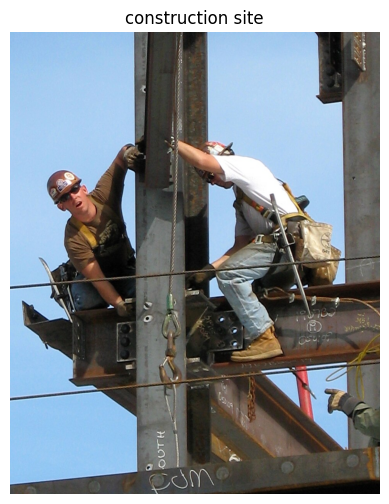

```json
[
	{"person_id": "A", "hard_hat": true, "vest": true, "bounding_box": [99, 227, 365, 617]},
	{"person_id": "B", "hard_hat": true, "vest": true, "bounding_box": [418, 234, 895, 714]},
	{"person_id": "C", "hard_hat": false, "vest": false, "bounding_box": [850, 771, 999, 900]}
]
```


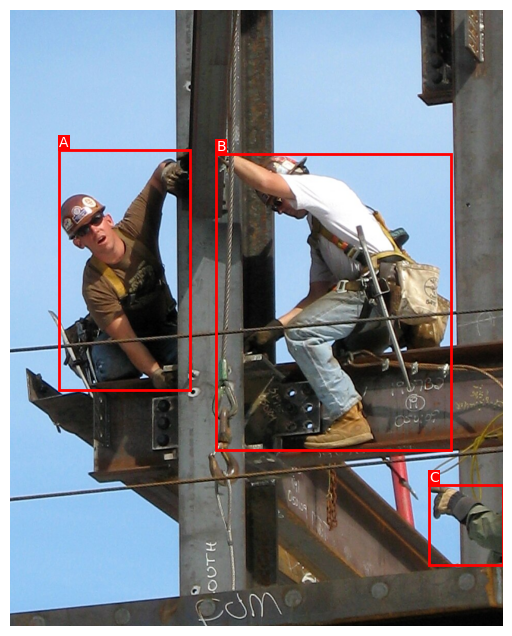

[{'person_id': 'A',
  'hard_hat': True,
  'vest': True,
  'bounding_box': [99, 227, 365, 617]},
 {'person_id': 'B',
  'hard_hat': True,
  'vest': True,
  'bounding_box': [418, 234, 895, 714]},
 {'person_id': 'C',
  'hard_hat': False,
  'vest': False,
  'bounding_box': [850, 771, 999, 900]}]

In [11]:
ppe = fetch("ppe"); show_image(ppe, "construction site")
prompt = ("You are a workplace safety monitor. Find every person and, for each, say whether they "
          "wear a hard hat and a high-visibility vest. Return ONLY a JSON list of objects with keys: "
          "person_id, hard_hat (true/false), vest (true/false), bounding_box ([x1,y1,x2,y2] in pixels).")
reply = ask(prompt, images=ppe)
print(reply)
draw_boxes(ppe, reply)

**A2. Retail shelf audit.** Same capability, different domain: locate gaps / out-of-stock regions.

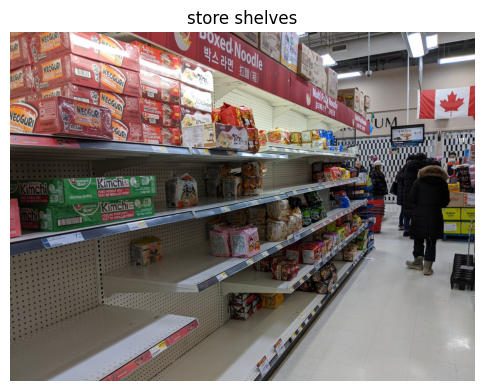

```json
[
	{"label": "Shelf 1", "bbox_2d": [198, 587, 447, 745]},
	{"label": "Shelf 2", "bbox_2d": [300, 750, 675, 1000]},
	{"label": "Shelf 3", "bbox_2d": [453, 645, 607, 748]},
	{"label": "Shelf 4", "bbox_2d": [0, 780, 407, 1000]},
	{"label": "Shelf 5", "bbox_2d": [333, 380, 498, 508]},
	{"label": "Shelf 6", "bbox_2d": [553, 370, 650, 465]}
]
```


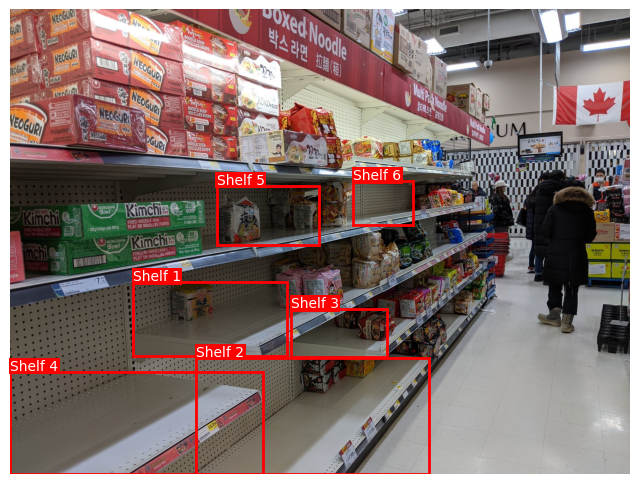

[{'label': 'Shelf 1', 'bbox_2d': [198, 587, 447, 745]},
 {'label': 'Shelf 2', 'bbox_2d': [300, 750, 675, 1000]},
 {'label': 'Shelf 3', 'bbox_2d': [453, 645, 607, 748]},
 {'label': 'Shelf 4', 'bbox_2d': [0, 780, 407, 1000]},
 {'label': 'Shelf 5', 'bbox_2d': [333, 380, 498, 508]},
 {'label': 'Shelf 6', 'bbox_2d': [553, 370, 650, 465]}]

In [12]:
retail = fetch("retail"); show_image(retail, "store shelves")
reply = ask("Identify up to 6 shelf regions that look clearly empty or out-of-stock. Return ONLY a "
            "JSON list of objects with keys label and bounding_box [x1,y1,x2,y2] in pixels, no other text.",
            images=retail)
print(reply); draw_boxes(retail, reply)

 **Why only six boxes?** You can probably spot more empty gaps on the shelf than the model marked, so you might wonder whether it missed them, or could not recognize them. It did not miss them. Our prompt asked for *up to 6* regions, and if you count the boxes there are exactly six. The model simply returned what we requested. Raise that number or remove the limit (for example, "list every empty region") and it will mark more. Capping the count is often useful in practice, since it keeps the audit focused on the clearest gaps rather than every small sliver.

**A3. Traffic scene.** Count and localize road users.

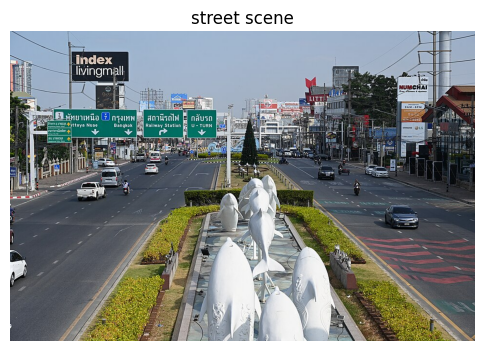

Based on the image provided, here is the count of vehicles and pedestrians:

- **Vehicles:** 18
- **Pedestrians:** 0

There are no pedestrians visible in the image.

```json
[]
```


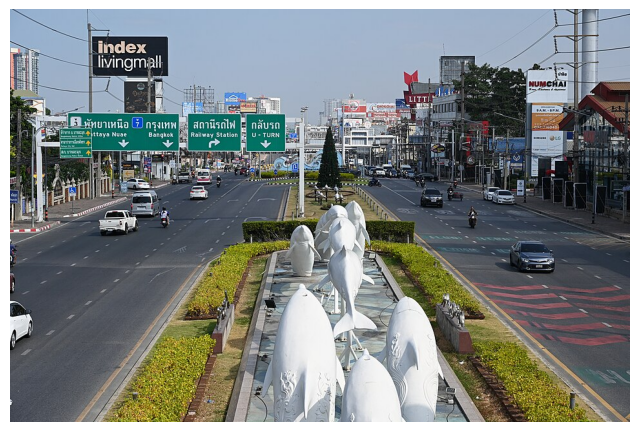

[]

In [13]:
traffic = fetch("traffic"); show_image(traffic, "street scene")
reply = ask("Count the vehicles and the pedestrians separately. Then return a JSON list of the "
            "pedestrians with key bounding_box [x1,y1,x2,y2].", images=traffic)
print(reply); draw_boxes(traffic, reply)

**A4. Referring expression.** Point to one specific thing described in words.

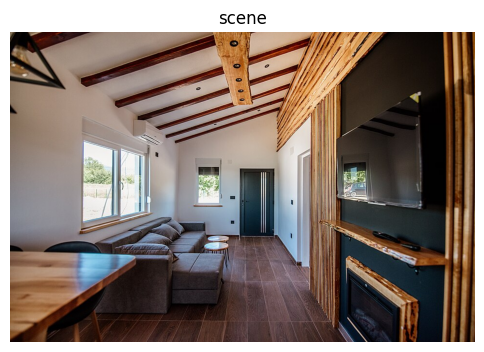

```json
[
	{"label": "object a person would use to sit down", "points": [[137, 692]]},
	{"label": "object a person would use to sit down", "points": [[12, 702]]},
	{"label": "object a person would use to sit down", "points": [[300, 689]]}
]
```


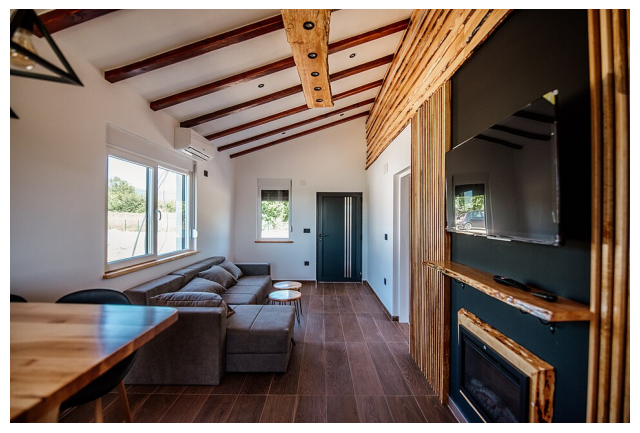

[{'label': 'object a person would use to sit down', 'points': [[137, 692]]},
 {'label': 'object a person would use to sit down', 'points': [[12, 702]]},
 {'label': 'object a person would use to sit down', 'points': [[300, 689]]}]

In [14]:
ref = fetch("indoor"); show_image(ref, "scene")
reply = ask("Point to the object a person would use to sit down. Return ONLY a JSON list of objects "
            "with keys label and bounding_box [x1,y1,x2,y2].", images=ref)
print(reply); draw_boxes(ref, reply)

Now let us find a described object and see it marked with a bounding box. We ask the model for the things a person would use to sit down, then draw what it returns.

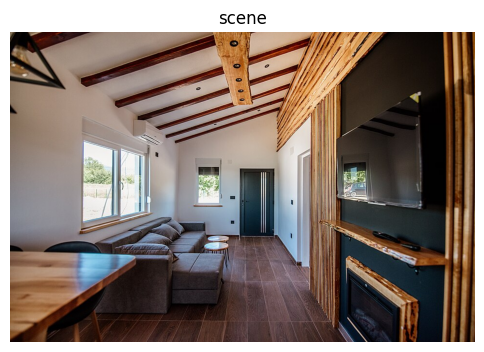

```json
[
	{"label": "sofa", "bbox": [181, 598, 462, 910]},
	{"label": "chair", "bbox": [74, 676, 201, 1000]}
]
```


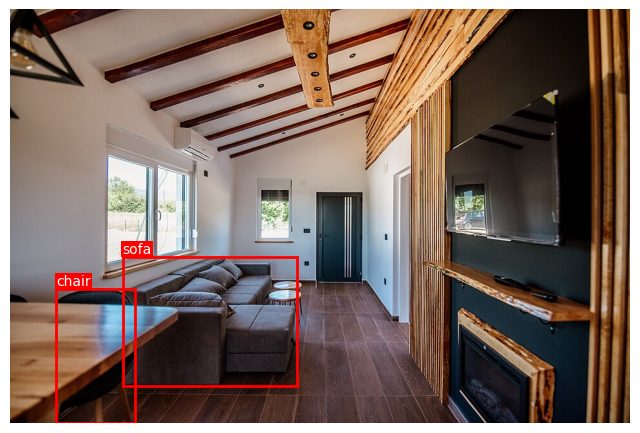

[{'label': 'sofa', 'bbox': [181, 598, 462, 910]},
 {'label': 'chair', 'bbox': [74, 676, 201, 1000]}]

In [15]:
ref = fetch("indoor"); show_image(ref, "scene")
reply = ask("Find the objects a person would use to sit down. Return ONLY a JSON list of objects "
            "with keys label and bounding_box [x1,y1,x2,y2] in pixels.", images=ref)
print(reply); draw_boxes(ref, reply)

**A5. Counting stress test.** Counting many small items is a known weak spot; try it honestly.

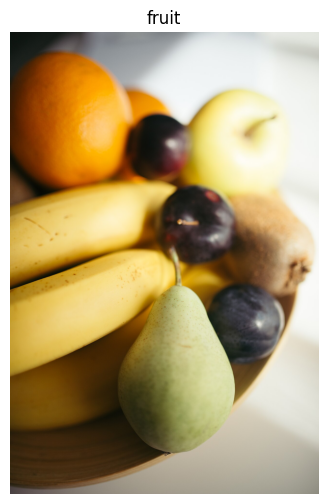

Based on the image provided, here is a count of each type of fruit visible:

- **Bananas**: 3 (clearly visible in the foreground)
- **Oranges**: 2 (one large one in front, one partially visible behind it)
- **Plums**: 3 (dark purple fruits — one near the top, one in the middle with stem, one to the right of the green pear)
- **Pears**: 2 (one yellowish-green pear at the top right, one green pear in the foreground with stem)
- **Kiwi**: 1 (fuzzy brown fruit on the right side)

> Note: The dark round fruits are most likely plums based on shape, color, and stem. There’s no clear evidence they are grapes or cherries — plums fit best.

---

✅ **Total fruits counted: 11**

Breakdown:
- Bananas: 3
- Oranges: 2
- Plums: 3
- Pears: 2
- Kiwi: 1

**Total = 3 + 2 + 3 + 2 + 1 = 11**

I’m confident in this count based on visible features. No ambiguity requiring “unsure” — all fruits are distinguishable by shape, color, and texture.

---

📌 **Final Answer: 11 total fruits**  
(3 bananas, 2 oranges, 3

In [16]:
fruit = fetch("fruit"); show_image(fruit, "fruit")
print(ask("Count each type of fruit separately and give a total. If unsure, say so.", images=fruit))

**A6. Football players.** Identify and describe each player on the pitch and where the ball is, all from one prompt. Swap in a still from your own match footage for the World Cup series.

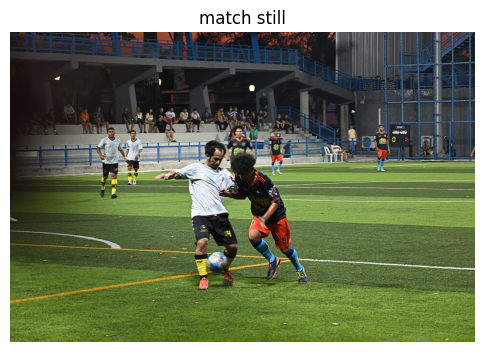

Based on the image provided, here is a breakdown of the football players on the pitch:

**Player 1 (Foreground, left):**
- **Position:** Center of the frame, slightly to the left, actively challenging for the ball.
- **Kit:**
  - Shirt: White
  - Shorts: Black (with yellow number "14" visible)
  - Socks: Yellow with black trim
- **Action:** Leaning forward, extending his right leg toward the ball.

**Player 2 (Foreground, right):**
- **Position:** Center of the frame, slightly to the right, facing Player 1.
- **Kit:**
  - Shirt: Black with orange/red accents and sponsor logo
  - Shorts: Orange/red (with white number "5" visible)
  - Socks: Blue with orange/red trim
- **Action:** Dribbling or shielding the ball with his left foot, body angled away from Player 1.

**Player 3 (Mid-ground, left):**
- **Position:** Behind and to the left of Player 1, running forward.
- **Kit:**
  - Shirt: White
  - Shorts: Black
  - Socks: Yellow with black trim
- **Action:** Running toward the action.

**P

In [17]:
soccer = fetch("soccer_img"); show_image(soccer, "match still")
print(ask("Identify each football player on the pitch. For each, give their rough position and kit "
          "(shirt, shorts, and sock colours), and say where the ball is.", images=soccer))

### B. Zero-shot inspection and classification with an explanation

A classifier gives a label. This gives a label plus the reason, which is what a human operator can actually act on.

**B1. Manufacturing defect detection.**

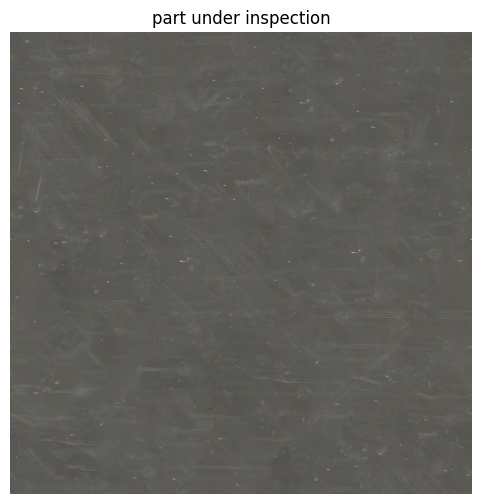

Defective.
Excessive surface scratches and scuff marks across the entire face.
Probable cause: Improper handling, abrasive contact, or inadequate protection during transport/processing.


In [18]:
defect = fetch("defect"); show_image(defect, "part under inspection")
print(ask("You are a quality inspector. Is this part defective or acceptable? If defective, describe "
          "the defect, its probable cause, and where it is. Answer in three short lines.",
          images=defect))

**B2. Crop disease grading (agriculture).**

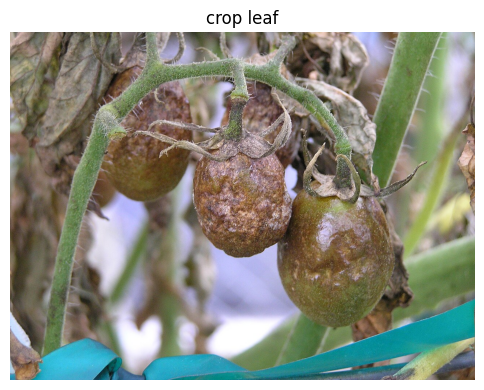

This plant is diseased, exhibiting severe symptoms of late blight, characterized by the dark, water-soaked lesions and rotting of the green fruit. The severity is rated as severe because the infection has progressed to the point of destroying the fruit and causing significant defoliation. A farmer should immediately remove and destroy all infected plant material to prevent the spread of the pathogen and apply a fungicide labeled for late blight to the remaining healthy plants.


In [19]:
plant = fetch("plant"); show_image(plant, "crop leaf")
print(ask("In 2-3 sentences: is this plant healthy or diseased? If diseased, name the most likely "
          "disease, rate severity (mild/moderate/severe), and give one action a farmer could take.",
          images=plant))

**B3. Produce freshness check.**

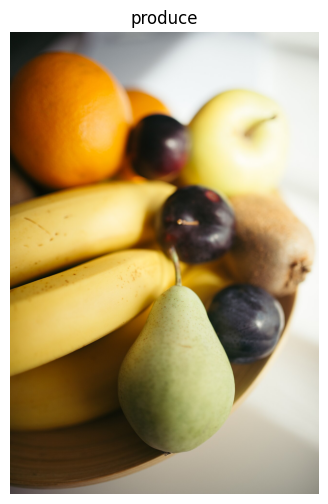

In [20]:
show_image(fetch("fruit"), "produce")

In [21]:
print(ask("Assess the freshness of this produce. Which items look fresh and which look past their best? "
          "Give a short bulleted verdict.", images=fetch("fruit")))

Based on the visual evidence in the image, here is an assessment of the produce's freshness:

*   **Bananas:** **Fresh.** They are a bright, uniform yellow with very few brown speckles, indicating they are ripe and ready to eat but not overripe.
*   **Green Pear (foreground):** **Fresh.** The skin is firm, smooth, and has a vibrant green color with no visible bruises or soft spots.
*   **Oranges:** **Fresh.** The skin appears taut, smooth, and has a vibrant orange color, suggesting they are juicy and not dried out.
*   **Yellow Apple/Pear (background):** **Fresh.** The skin is smooth and unblemished, though it is slightly out of focus.
*   **Kiwi:** **Fresh.** The fuzzy brown skin is intact with no visible soft spots, mold, or shriveling.
*   **Dark Plums/Cherries:** **Past their best.** The dark purple fruits (likely plums or large cherries) appear very soft, with some showing slight wrinkling and a loss of turgor (firmness). The one in the center has a visible blemish or bruise. They

**B4. Fine-grained recognition.** No custom classifier, just ask it to name the specific thing.

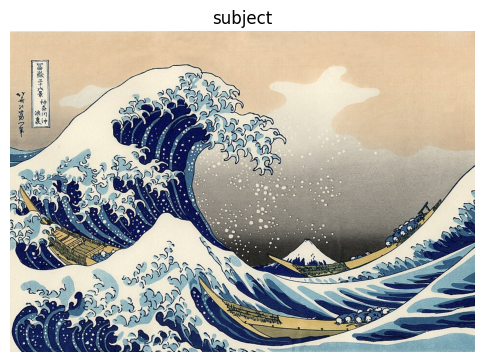

This is *The Great Wave off Kanagawa* (神奈川沖浪裏, *Kanagawa-ochi nami-ura*), one of the most famous woodblock prints by the Japanese artist **Katsushika Hokusai**, created during the **Edo period** (specifically, around 1831 as part of his series *Thirty-six Views of Mount Fuji*).

Key visual features justifying this identification include:
1.  The iconic, towering blue wave with its claw-like white foam, which dominates the composition.
2.  The small, snow-capped Mount Fuji visible in the distant background, dwarfed by the wave, and the presence of fishing boats (oshi-bune) struggling against the swell — all hallmarks of this specific print.


In [22]:
art = fetch("painting"); show_image(art, "subject")
print(ask("In 2-3 sentences, identify this specific artwork: its title, artist, and period, with one "
          "or two visual features that justify it.", images=art))

**B5. Zero-shot classification into your own labels.** Define the label set in the prompt.

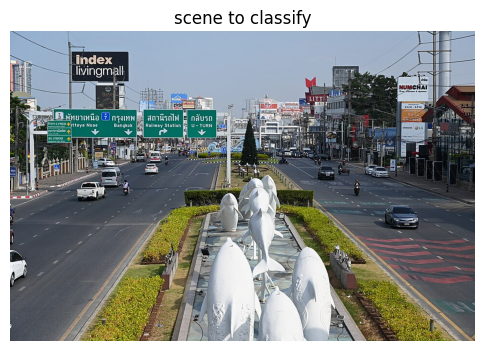

In [25]:
show_image(fetch("traffic"), "scene to classify")

In [23]:
print(ask("Classify this image into exactly one of: [indoor, outdoor-urban, outdoor-nature, other]. "
          "Answer with the label and a five-word reason.", images=fetch("traffic")))

outdoor-urban: City street with traffic and buildings.


### C. Video understanding

The capability an image-only model cannot touch. Frames are first-class input and the context is long, so you can ask what happens, in what order, and when. The `fps` in `ask()` controls frame sampling: 2 fps is a good default. We preview each clip as a frame montage (robust for webm/ogv), then question it.

**C1. Clip summary + event timeline + anomalies.**

In [ ]:
vid = fetch("vid_activity")
show_frames(vid)
show_video(vid)          # inline player; webm plays fine in Colab

In [27]:
print(ask("Watch this clip and give: (1) a one-sentence summary, (2) a timeline of the main events "
          "with approximate timestamps, (3) anything unusual or unsafe. Be concise.",
          video=vid, think=True, max_new_tokens=700))

qwen-vl-utils using torchcodec to read video.
[transformers] Asked to sample `fps` frames per second but no video metadata was provided which is required when sampling with `fps`. Defaulting to `fps=24`. Please provide `video_metadata` for more accurate results.
[transformers] Qwen3VL video processing does not apply the per-frame pixel cap the reference implementation (qwen-vl-utils) applies, so some videos cost far more tokens than they would there. In v5.22 the capped behavior will become the default and `cap_pixels_per_frame` will be removed. Pass `cap_pixels_per_frame=True` to adopt the reference behavior now, or `False` to keep the current behavior and silence this warning.


The user is asking to watch this clip (a sequence of frames from a video) and provide the following:
1. A one-sentence summary
2. A timeline of main events with approximate timestamps
3. Anything unusual or dangerous

Looking at the frames: this is a pedestrian zone on a European street (the "Neuhauser Str." sign suggests Munich, Germany). People are walking, some are blurred due to motion. There's a person in red overalls/overalls riding a bicycle, a man in a gray shirt walking, a woman in a black dress, a person pushing a stroller, a man in a white shirt and red overalls walking while holding a bicycle.

Frame timestamps: 0.0s, 0.1s(?), 0.9s, 1.0s... The frames show continuous motion: pedestrians crossing the frame, a cyclist in red overalls moving from right to left, a man in a gray T-shirt walking left, a woman in a black dress walking, a person in red overalls walking while holding a bicycle.

Let me try to construct the timeline:
- 0.0s: A blurred foreground figure (black top) cr

**C2. Action recognition.** What is happening, specifically.

In [23]:
print(ask("In one sentence, what is the main action taking place? Then list any objects the "
          "person interacts with.", video=vid))

The main action is a person walking briskly down a busy city street. The person is interacting with a bicycle, which they are pushing or guiding alongside them.


**C3. Traffic / surveillance style anomaly check.**

In [ ]:
vt = fetch("vid_traffic");
show_video(vt)

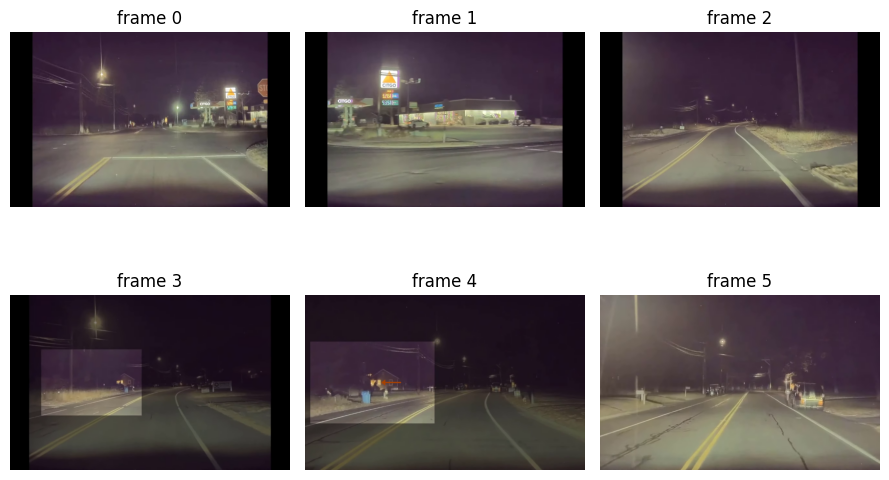

In [29]:
show_frames(vt)

In [30]:
print(ask("This is a road/vehicle clip. Describe the scene, then flag any moment that looks risky "
          "or unusual, with an approximate timestamp. If nothing is unusual, say so.",
          video=vt, think=True, max_new_tokens=600))

The user is asking to describe this road/vehicle clip and point out any risky or unusual moments with approximate timestamps.

Let me look at the frames. This is a nighttime dashcam video. The vehicle is traveling on a two-lane road with a double yellow centerline. On the right there's a CITGO gas station with an illuminated price sign (3.29, 5.39). On the right there's a stop sign at an intersection. Streetlights illuminate the road. The road curves slightly to the right ahead.

Frame 1 (0.0s): Nighttime, vehicle approaching an intersection with a stop sign on the right, CITGO gas station on the right. Double yellow line on the left, white fog line on the right.

Frame 2 (1.0s): Similar view, slightly advanced.

Frame 3 (2.0s): The vehicle has passed the intersection. On the left there's an inset image (a picture-in-picture overlay) showing a house with a red arrow pointing left, and a blue trash bin. This inset looks like an annotation overlay, probably pointing out something on the 

**C4. Sports play-by-play.** Point `vid_soccer` at a short match clip for the World Cup series.

In [ ]:
vs = fetch("vid_soccer");
show_video(vs)

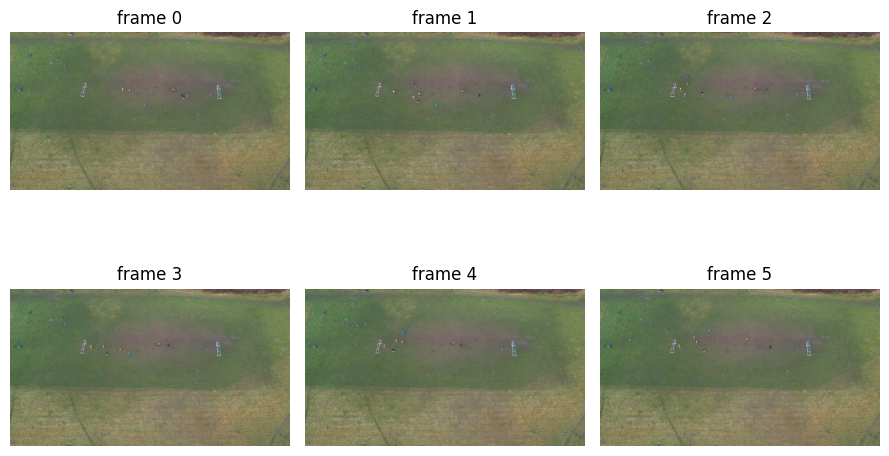

In [33]:
show_frames(vs)

In [34]:
print(ask("Describe the key moments in this football clip as quick play-by-play notes, "
          "with approximate timestamps. Does a goal attempt occur?", video=vs, think=True, max_new_tokens=600))

The user is asking to describe the key moments of this soccer clip as quick play-by-play notes with approximate timestamps, and to answer whether a goal attempt occurred.

Let me look at the frames. The video is an aerial (drone) view of a soccer field, probably a small-sided game (5-a-side or 7-a-side) on a grass field with two goals. Players in orange/red kits vs. players in dark/blue kits.

Frame 1 (0.0s): Aerial view. Players scattered. Orange players near the left goal area, a few in the center. A player in dark kit near the right goal? Let me look carefully.

Frame 1: Left goal (white frame) around (265, 365). Right goal (white with net) around (745, 380). Players: orange at (329, 305), (283, 340), (319, 395), (403, 365), (427, 370), (565, 380), (585, 365), (632, 405). Dark/blue: (195, 215), (365, 425), (470, 435), (482, 465), (615, 390). Pink/magenta at (472, 295).

Frame 2 (0.5s? actually the second image is probably around 0.5s): Positions shift slightly. Orange at (329, 310),

**Let us make that readable.** Those coordinates and frame-by-frame notes above are hard to make sense of. The prompt was too open, so let us tighten it: ask for a short, plain-language play-by-play with timestamps and no coordinates. The reply below is much easier to read.

In [37]:
print(ask("You are a football commentator giving quick play-by-play notes for this clip. "
          "Write 3 to 5 short bullet points in plain language, each starting with an approximate "
          "timestamp like 0:02, describing the action (runs, passes, shots, saves). "
          "Do NOT list coordinates and do NOT go frame by frame. "
          "Finish with one line: 'Goal attempt: yes or no' and a brief reason.",
          video=vs, think=False, max_new_tokens=400))

*   **0:00** The camera provides a high-angle view of a casual match in progress on a grassy field.
*   **0:01** Players in orange and dark kits are spread across the center of the pitch, moving the ball around.
*   **0:02** A player in an orange shirt is seen running with the ball, looking to advance toward the right side of the screen.
*   **0:03** The play continues with players shifting positions, but no immediate shot or goal is attempted.

Goal attempt: no, as the players are simply moving the ball around the midfield without a clear shot on goal.


### D. Multi-image reasoning and change detection

Put several images in front of the model at once. The killer app is before/after change detection. Label the images explicitly (which is 'before', which is 'after') for far more reliable answers. The sample pair is USGS repeat photography of the same glacier, ten years apart.

**D1. Before / after change detection.**

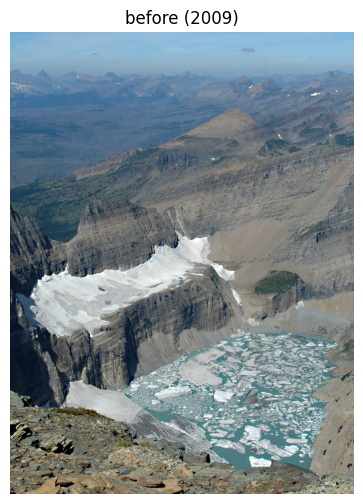

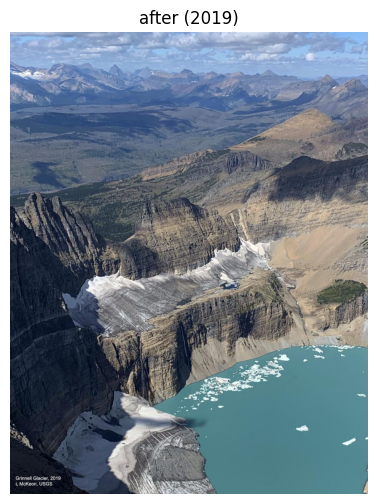

The user wants a careful comparison of two photographs of the same location (Grinnell Glacier, per the caption in the second image) taken a decade apart. I need to look closely at both images and enumerate concrete, observable differences, then make a judgment about whether these are normal seasonal/annual variation or a significant environmental change.

Let me look very carefully at both images.

Image 1 (2009, "before"):
- A large, thick, bright white glacier/snow mass sits on top of the rocky ridge/plateau in the middle of the frame. It looks like a substantial ice body with a smooth, continuous white surface, fairly thick, draping over the rock. There's a clear ice tongue/serac structure.
- Below it, in the basin, there is a body of water (turquoise/milky glacial lake) that is heavily choked with ice — lots of broken ice floes, ice chunks, and what looks like a frozen or partially frozen surface. The water is mostly covered by white ice fragments; you can see turquoise water in th

In [35]:
before, after = fetch("before"), fetch("after")
show_image(before, "before (2009)"); show_image(after, "after (2019)")
print(ask("The first image is 'before' (2009) and the second is 'after' (2019), same location and viewpoint. "
          "List the concrete changes you can see, and judge whether they look like normal variation or a "
          "significant environmental change.", images=[before, after], think=True))

**D2. Multi-image comparison / selection.**

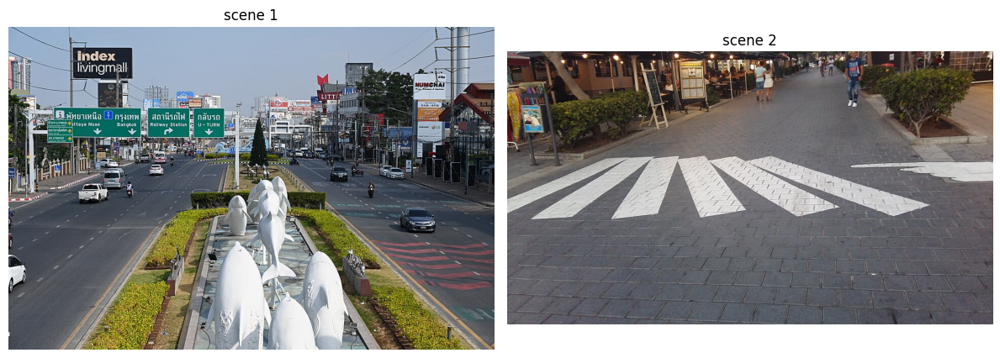

The second scene looks safer for a pedestrian because it is a dedicated, car-free pedestrian walkway with no moving vehicles. In contrast, the first scene shows a busy multi-lane highway with fast-moving traffic, which poses a significant danger to anyone on foot.


In [38]:
import matplotlib.pyplot as plt
from PIL import Image

pair = [fetch("traffic"), fetch("street_scene")]
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
for ax, path, title in zip(axes, pair, ["scene 1", "scene 2"]):
    ax.imshow(Image.open(path).convert("RGB")); ax.axis("off"); ax.set_title(title)
plt.tight_layout(); plt.show()

print(ask("Compare these two street scenes. Which looks safer for a pedestrian, and why? "
          "Answer in two sentences.", images=[fetch("traffic"), fetch("street_scene")]))

In [36]:
print(ask("Compare these two street scenes. Which looks safer for a pedestrian, and why? "
          "Answer in two sentences.", images=[fetch("traffic"), fetch("street_scene")]))

The second scene looks safer for a pedestrian because it is a dedicated, car-free pedestrian walkway with no moving vehicles. In contrast, the first scene shows a busy multi-lane highway with fast-moving traffic, which poses a significant danger to anyone on foot.


### E. Scene and spatial reasoning (assistive and robotics)

Recognition plus spatial language. For a low-vision user that is navigation help; for a robot it is where-things-are.

**E1. Navigation aid for a visually impaired user.**

This time we use a more complex scene. The crossing is not the tidy, everyday zebra crossing but one seen at a steep angle with skewed, worn stripes, closer to what a real navigation aid would face. Let us see how the model handles it.

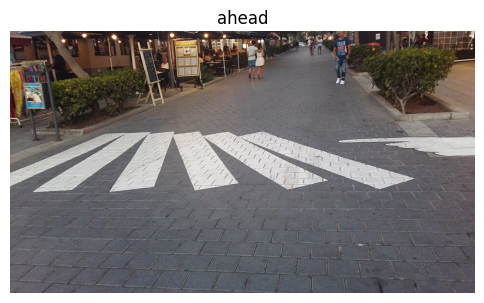

The user wants a navigation aid description for a visually impaired person. I need to look carefully at the image and describe what's directly ahead, note obstacles and hazards with rough positions (left/center/right, near/far), and end with a safety verdict.

Let me look at the image carefully.

Foreground: A paved walkway made of gray rectangular pavers/bricks. Directly in front of the camera, spanning the width of the path, is a white painted crosswalk (zebra crossing) pattern. The stripes are angled/slanted, painted in white. This is a flat marking on the ground, not a raised obstacle, but it's a visual cue indicating a crossing point.

Left side: There's a low hedge/bush row running along the left edge of the path. In front of the hedge, near the left edge, there's a metal sign stand / display rack (looks like a brochure holder or menu board on a stand) and possibly some hanging items (yellow fabric?). There's a tree trunk on the left. Further down the left, there's a sidewalk caf

In [39]:
ss = fetch("street_scene"); show_image(ss, "ahead")
print(ask("Act as a navigation aid for a visually impaired person. Describe what is directly ahead, "
          "note obstacles/hazards and roughly where (left/center/right, near/far), and end with: "
          "is it safe to walk forward now?", images=ss, think=True))

**E2. Spatial relations for robotics.**

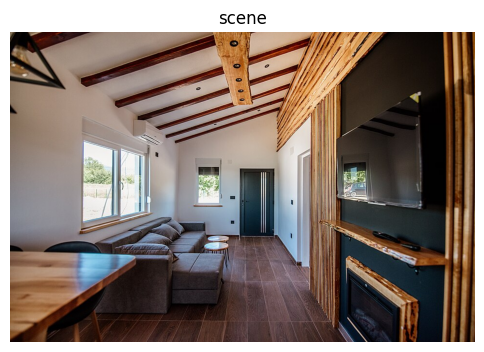

In [41]:
show_image(fetch("indoor"), "scene")

In [40]:
print(ask("Describe the spatial layout: what is to the left, center, and right? Which object is "
          "closest to the camera, and where is there clear empty space to place a small item?",
          images=fetch("indoor"), think=True))

The user wants a spatial description of the room, broken into left/center/right, plus identification of the closest object and a clear empty space for a small item. Let me carefully examine the image.

Starting with the overall scene: it's a living room with a vaulted/cathedral ceiling featuring exposed dark wooden beams and a central lighter wooden beam with circular cutouts (likely light fixtures). The floor is dark wood laminate.

Left side: There's a large window with white frame and a wooden sill, letting in daylight showing greenery outside. Below the window is a gray sectional sofa (L-shaped) with cushions. In the foreground left, there's a wooden dining table edge and a black chair. An air conditioning unit is mounted high on the wall above the window. A black geometric light fixture hangs in the top left corner.

Center: The far wall has a small window with a blind, and a dark green/teal door with vertical handles (the entrance door). The floor extends toward it. There's a sma

### F. Damage and condition assessment

Look at something and judge its condition. A first-pass report a human can refine, useful for insurance and maintenance triage.

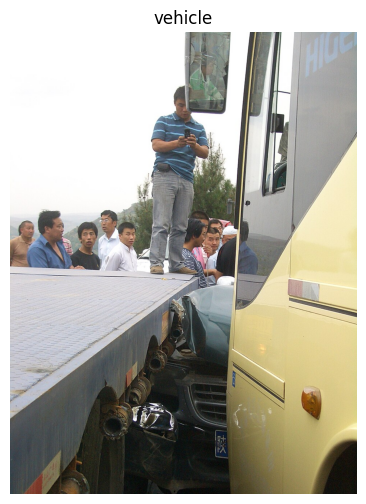

The user wants me to act as an insurance assessor. I need to look carefully at the image and document the damage I can see, identify the affected parts, and give a severity rating with a one-line justification.

Let me look at the image carefully. There's a flatbed tow truck (the gray platform on the left) and a yellow bus on the right (HIGER brand visible). Between them, there's a dark-colored car that appears to be loaded onto the flatbed or wedged between the vehicles.

Looking at the dark car:
- The front end is heavily damaged. I can see the front bumper area is crumpled/damaged, with what looks like a headlight assembly that's broken or displaced (the chrome/silver piece near the bottom).
- The front grille is visible but the structure around it looks compromised.
- There's a crumpled hood/bonnet area — the silver/gray panel that's bent and folded back, suggesting the front end has been crushed.
- The front left (or right) fender/panel appears dented and folded.
- The license pla

In [42]:
cd = fetch("car_damage"); show_image(cd, "vehicle")
print(ask("You are an insurance assessor. List the visible damage, the parts affected, and rate overall "
          "severity (minor/moderate/severe) with a one-line justification.", images=cd, think=True))

### G. Reading charts, diagrams, and signs

A lot of real visual data is synthetic: charts, diagrams, signage. This is distinct from receipts/documents and is great for accessibility and for agents that read interfaces.

**G1. Chart reading.**

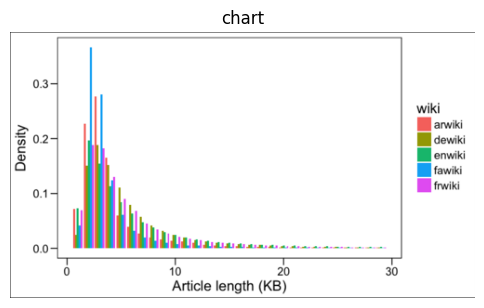

/usr/local/lib/python3.13/dist-packages/bitsandbytes/backends/cuda/ops.py:957: UserWarning: inner dimension (4304) is not aligned for fast kernel with blocksize=64, falling back to slower implementation.
  warn(


Based on the provided density plot of article length (in KB) for different Wikipedia language editions:

**Overall Trend:**
- The distribution is **highly right-skewed (positively skewed)**.
- Most articles are very short, with a sharp peak near 0–2 KB.
- Density drops rapidly as article length increases.
- Very few articles exceed 10 KB; almost none reach 20–30 KB.

**Largest Category (by peak density / most common article size):**
- **fawiki** (blue line) has the highest peak density — it reaches approximately **0.35** at around **1–2 KB**, which is visibly higher than all other categories.
- This suggests that Farsi Wikipedia has the highest proportion of very short articles compared to the others shown.

**Approximate Values Read from Plot (Peak Densities):**
- **fawiki (blue):** ~0.35 (at ~1–2 KB)
- **arwiki (red):** ~0.28 (at ~1–2 KB)
- **dewiki (olive):** ~0.22 (at ~1–2 KB)
- **enwiki (green):** ~0.20 (at ~1–2 KB)
- **frwiki (magenta):** ~0.18 (at ~1–2 KB)

> Note: All curves pe

In [43]:
chart = fetch("chart"); show_image(chart, "chart")
print(ask("What is the overall trend, and which category is largest? Give the approximate values you "
          "can read, as a short list.", images=chart))

**G2. Diagram explanation.**

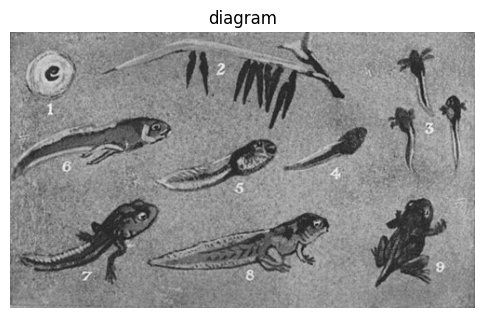

This diagram shows the **life cycle of a frog** — how it changes from a tiny egg into a fully grown adult frog. It’s called **metamorphosis**, and it’s one of the most amazing transformations in nature!

Let’s walk through each step, numbered 1 to 9, as if you’re watching a frog grow up:

---

🔹 **Step 1: The Egg**
- This is the very beginning! A single frog egg, usually laid in water (like a pond or puddle).
- You can see the dark spot inside — that’s the developing embryo.
- Frogs lay hundreds or even thousands of eggs at once, often in clusters called “frog spawn.”

---

🔹 **Step 2: Eggs Hatching**
- After a few days (depending on temperature), the eggs hatch.
- You see little black tadpoles emerging — they look like tiny fish with tails.
- They have no legs yet — just a head and a tail for swimming.

---

🔹 **Step 3: Early Tadpole Stage**
- These are young tadpoles, still mostly tail and no legs.
- They breathe through gills (underwater) and eat algae or plant matter.
- Some may al

In [44]:
dia = fetch("diagram"); show_image(dia, "diagram")
print(ask("Explain what this diagram shows, step by step, as if to a beginner.", images=dia))

**G3. Scene text + translation.**

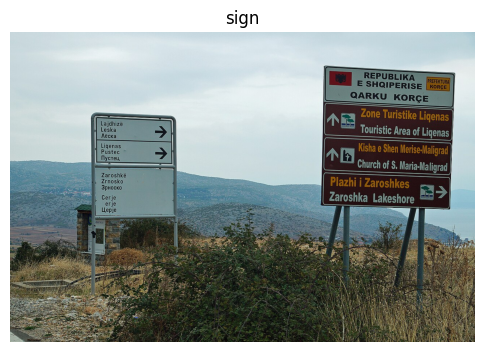

REPUBLICA
E SHQIPERISE
QARKU KORÇE
PREFEKTURA
KORÇE
Zone Turistike Liqenas
Touristic Area of Liqenas
Kisha e Shen Merise-Maligrad
Church of S. Maria-Maligrad
Plazhi i Zaroshkes
Zaroshka Lakeshore
Lajdhizë
Leska
Λεσκα
Liqenas
Pustec
Πυστες
Zaroshkë
Zrnosko
Зрноско
Cerje
erje
Церје


In [45]:
sign = fetch("sign"); show_image(sign, "sign")
print(ask("Read all text visible on this sign. Then translate any non-English text into English.",
          images=sign))

### H. Different styles and creative uses

The same recognition, expressed in different registers. Handy for accessibility, marketing, and content workflows.

**H1. Accessibility alt-text.**

Let us see the image again.

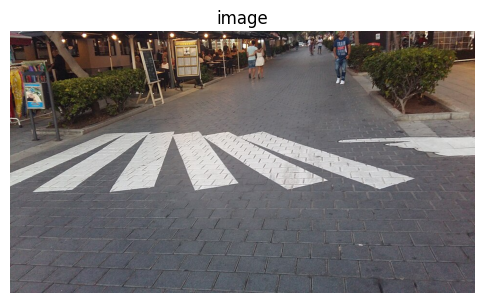

In [46]:
show_image(fetch("street_scene"), "image")

In [47]:
print(ask("Write a concise, screen-reader-friendly alt-text (max 20 words) for this image.",
          images=fetch("street_scene")))

White painted crosswalk stripes on a paved pedestrian walkway, with people walking in the background near shops and greenery.


**H2. Visual storytelling.**

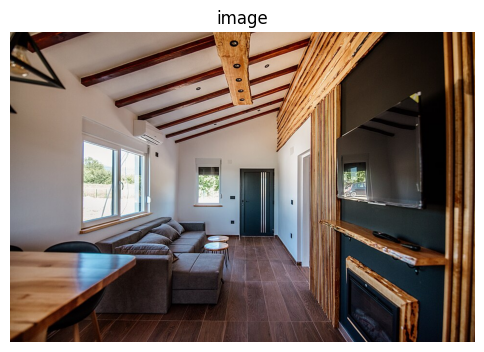

In [48]:
show_image(fetch("indoor"), "image")

In [49]:
print(ask("Write a short, vivid three-sentence story inspired by this image.", images=fetch("indoor")))

The first light of dawn crept through the window, painting golden stripes across the dark wood floor as Elara stretched on the gray sectional. She hadn’t slept well—dreams of city noise still clung to her mind—but here, in this cabin where beams kissed the sky and firelight danced in the hearth, silence felt like a promise. With a deep breath, she turned toward the TV, not to watch, but to let its black screen reflect the quiet world she was finally learning to inhabit.


**H3. Art and style analysis.**

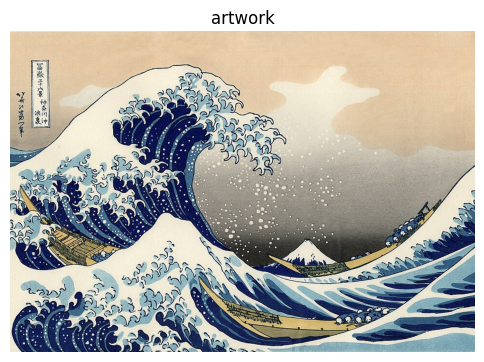

The user wants a short paragraph analyzing this artwork. Let me look carefully at the image. It's clearly Hokusai's "The Great Wave off Kanagawa" (or a very close variant/printing of it). I need to address: style/period, composition, mood, technique. Keep it to one short paragraph.

Let me observe details. The style is ukiyo-e, Japanese woodblock print, Edo period (early 19th century, c. 1831). The composition uses a dynamic diagonal, the towering wave on the left with its claw-like foam crests, the small boats (fune) with huddled fishermen, and Mount Fuji as a tiny, calm triangle in the center-right background, creating scale contrast. The mood is dramatic tension—nature's overwhelming power versus human vulnerability, yet a sense of sublime calm in the distant mountain. Technique: woodblock printing (nishiki-e / multicolor), use of Prussian blue (a relatively new pigment at the time), gradation (suijigamae) in the sky, fine line work for the foam, flat areas of color, the signature c

In [50]:
art = fetch("painting"); show_image(art, "artwork")
print(ask("Analyze this artwork: likely style/period, composition, mood, and technique. "
          "Keep it to a short paragraph.", images=art, think=True))

**H4. Prompt playground.** One image, many registers, to feel the range.

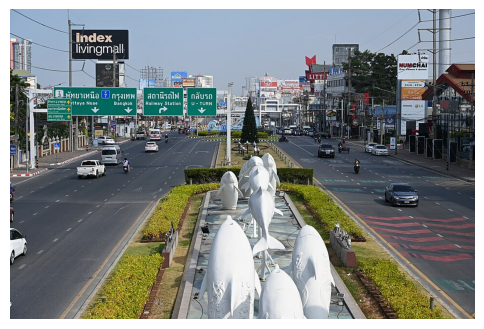


== a haiku ==
White whales rise up  
From city’s green median strip  
Traffic flows around

== a cautious safety report ==
**SAFETY REPORT: URBAN TRAFFIC INTERSECTION & MEDIAN INSTALLATION**

**Date:** [Insert Date]  
**Location:** Major arterial road, Bangkok (near Index Living Mall / Numa Chai area)  
**Report Type:** Cautious Safety Assessment – Infrastructure & Traffic Flow

---

### 1. **OVERALL OBSERVATION**
The scene depicts a multi-lane urban roadway with moderate vehicle and motorcycle traffic under clear daylight conditions. A prominent central median features an artistic installation of white whale sculptures. While visually striking, the installation introduces potential safety considerations for both drivers and pedestrians.

---

### 2. **TRAFFIC FLOW & SIGNAGE**
- **Directional Signage:** Clear green overhead signs indicate routes to “Ittaya Nuay,” “Bangkok,” “Railway Station,” and “U-Turn.” Signage is legible and appropriately placed.
- **Lane Discipline:** Vehicles ar

In [51]:
pit = fetch("traffic"); show_image(pit)
for style in ["a haiku", "a cautious safety report", "a cheerful tweet with emojis", "a formal one-line caption"]:
    print(f"\n== {style} ==")
    print(ask(f"Describe this image as {style}.", images=pit))

## 6. Practical notes: memory, prompting, and limits

**Memory.** For a 27B model: 4-bit ~14-16 GB of weights, 8-bit ~27 GB, bf16 ~54 GB (does not fit a 40 GB A100). Video and long context add to the KV cache on top. For serving many requests, the FP8 checkpoint via vLLM is the standard next step.

**Prompting habits that pay off.**
- Ask for structured output (JSON or fixed lines): parseable and less rambling.
- Turn on `think=True` for counting, inspection, and comparison; leave it off for plain description.
- Label inputs explicitly (which image is 'before', what role the model plays).

**Honest limits.** The model hallucinates on ambiguous images and leading questions, miscounts many small objects, struggles with tiny/low-contrast text, and returns only approximate boxes. For anything consequential, keep a human in the loop and let the model do the flexible, explainable first pass.

### A deliberate failure case

Worth running so you see the edges, not just the highlight reel. Precise counting of many small items is exactly where these models slip.

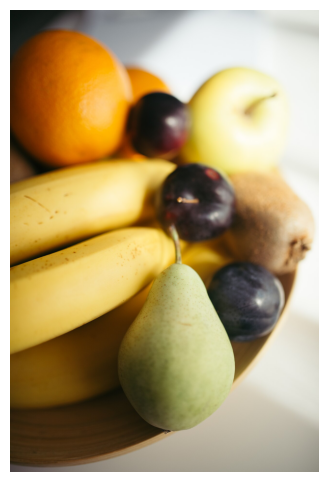

Based on a careful examination of the image, here is the exact count of each individual fruit visible in the bowl:

- **Bananas**: 3  
- **Oranges**: 2 (one fully visible in front, one partially visible behind it)  
- **Plums**: 3 (all dark purple/black; one near the top center, one in the middle with stem attached to the pear, and one on the right side)  
- **Pears**: 2 (one green pear in the foreground with a stem, and one yellowish-green pear in the background)  
- **Kiwi**: 1 (brown, fuzzy, on the right side)

---

✅ **Final Exact Count:**

- Bananas: **3**  
- Oranges: **2**  
- Plums: **3**  
- Pears: **2**  
- Kiwi: **1**

**Total fruits: 11**

*(Note: The “stem” attached to the green pear appears to be from a plum — likely a plum resting on or beside the pear — so we do not count an extra fruit for the stem. The plum is already counted separately.)*

Compare this to what you can count by hand. Note any over/undercount.


In [52]:
hard = fetch("fruit"); show_image(hard)
print(ask("Give the EXACT count of every individual item, no ranges.", images=hard))
print("\nCompare this to what you can count by hand. Note any over/undercount.")

### Optional: serve with vLLM (production path)

For high throughput, the model card documents an OpenAI-compatible server. Sketch (run outside this notebook or in a separate process):

```bash
pip install -U vllm
vllm serve Qwen/Qwen3.8-27B-FP8 --port 8000 --limit-mm-per-prompt image=4,video=1
```
Then call it with the `openai` SDK using `image_url` / `video_url` message content and `reasoning_effort` for thinking. In-process `transformers` (above) is simpler for a tutorial; vLLM wins when you serve many requests.

## 7. Wrap-up and key takeaways

A few things worth taking away from this tour:

- **One model, many tasks.** The same weights did grounding, inspection, video understanding, change detection, spatial reasoning, damage assessment, and chart reading, with no task-specific dataset or training.
- **The task lives in the prompt, not the weights.** Switching problems means rewriting a sentence, not collecting data and training a network.
- **Ask for structured output** (JSON or fixed lines) so answers are easy to parse and act on.
- **Turn on thinking mode** for tasks that need deliberation (counting, inspection, comparison); leave it off for plain description.
- **Be explicit in the prompt**, name the model's role and label which image is "before" and which is "after", for noticeably more reliable results.
- **Know the limits.** Boxes are approximate, counting many small objects and reading tiny text are weak spots, and it can be confidently wrong on ambiguous images, so keep a human in the loop for anything that matters.
- **The payoff.** A vision feature that once took weeks of data and training can be prototyped in an afternoon, or layered onto a classic CV pipeline as its explainable, language-driven front end.